<a href="https://colab.research.google.com/github/adam-marblestone/looking-at-first-eve-bio-data/blob/main/EvE_data_analysis_demo_NRs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import linkage, leaves_list
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from google.colab import drive
drive.mount('/content/drive')

# Load the data
data_both = pd.read_csv('/content/drive/MyDrive/evebio_summary_result_table.csv')

# Just agonists
data = data_both.loc[data_both['Mode']=="Agonist"]

# Pivot the data to prepare it for the heatmap
pivot_data = data.pivot(index='Compound', columns='Target_ID', values='Max')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
num_compounds = data["Compound"].nunique()
num_targets = data["Target_ID"].nunique()
print(num_compounds)
print(num_targets)

1397
19


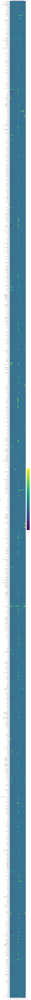

Number of compounds in heatmap: 1397


In [ ]:
# Plotting the heatmap with a large vertical size to show all compounds
plt.figure(figsize=(19/2.0, 1397/3.0))  # Increase the height significantly to accommodate all compounds
sns.heatmap(pivot_data, cmap='viridis', annot=False, cbar=True, vmin=-84, vmax=150)

# Set the labels and title
plt.xlabel('Target')
plt.ylabel('Compound')
plt.title('2D Heatmap of Max Activity by Target and Compound')

# Show the plot
plt.grid()
plt.show()

# Optional: Check if all compounds are included
num_compounds_in_heatmap = pivot_data.shape[0]
print(f"Number of compounds in heatmap: {num_compounds_in_heatmap}")

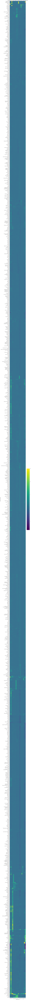

In [ ]:
# Fill any missing values with zeros
pivot_data_filled = pivot_data.fillna(0)

# Normalize the data for clustering only (scaling is not for visualization)
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_data_filled)

# Perform hierarchical clustering on compounds (rows)
linkage_matrix = linkage(scaled_data, method='ward')
ordered_indices = leaves_list(linkage_matrix)

# Perform hierarchical clustering on targets (columns)
column_linkage = linkage(pivot_data_filled.T, method='ward')
ordered_column_indices = leaves_list(column_linkage)

# Reorder the original (unscaled) data according to the clustering
pivot_data_unscaled_ordered_both = pivot_data.iloc[ordered_indices, ordered_column_indices]

# Plot the heatmap using the unscaled data for better contrast
plt.figure(figsize=(19/2.0, 1397/3.0))
sns.heatmap(pivot_data_unscaled_ordered_both, cmap='viridis', annot=False, cbar=True, vmin=-84, vmax=150)

# Set the labels and title
plt.xlabel('Target (Clustered)')
plt.ylabel('Compound (Clustered)')
plt.title('2D Heatmap of Max Activity by Target and Compound (Unscaled, Clustered on Both Axes)')

# Show the plot
plt.grid()
plt.show()

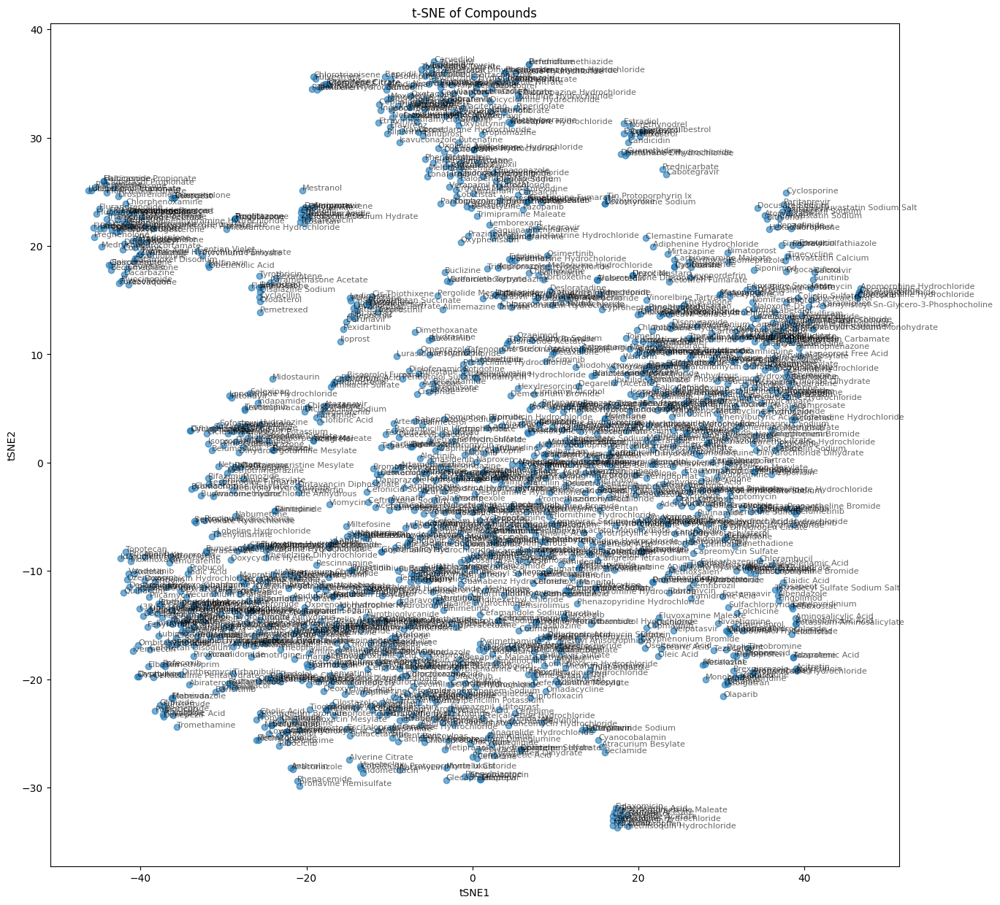

In [ ]:
# Running t-SNE with scaled data and optimized parameters
scaled_data = scaler.fit_transform(pivot_data_filled)
tsne_optimized = TSNE(n_components=2)
tsne_results_optimized = tsne_optimized.fit_transform(scaled_data)

# Create a DataFrame with the optimized t-SNE results
tsne_df_optimized = pd.DataFrame(tsne_results_optimized, columns=['TSNE1', 'TSNE2'])
tsne_df_optimized['Compound'] = pivot_data_filled.index

# Plotting the optimized t-SNE results
plt.figure(figsize=(15, 15))
plt.scatter(tsne_df_optimized['TSNE1'], tsne_df_optimized['TSNE2'], alpha=0.6)

# Annotating points only where TSNE1 is >= 0.0 to reduce clutter
for i in range(len(tsne_df_optimized)):
    plt.annotate(tsne_df_optimized['Compound'][i], (tsne_df_optimized['TSNE1'][i], tsne_df_optimized['TSNE2'][i]), fontsize=8, alpha=0.6)

# Set plot labels and title
plt.xlabel('tSNE1')
plt.ylabel('tSNE2')
plt.title('t-SNE of Compounds')

# Show the plot
plt.show()

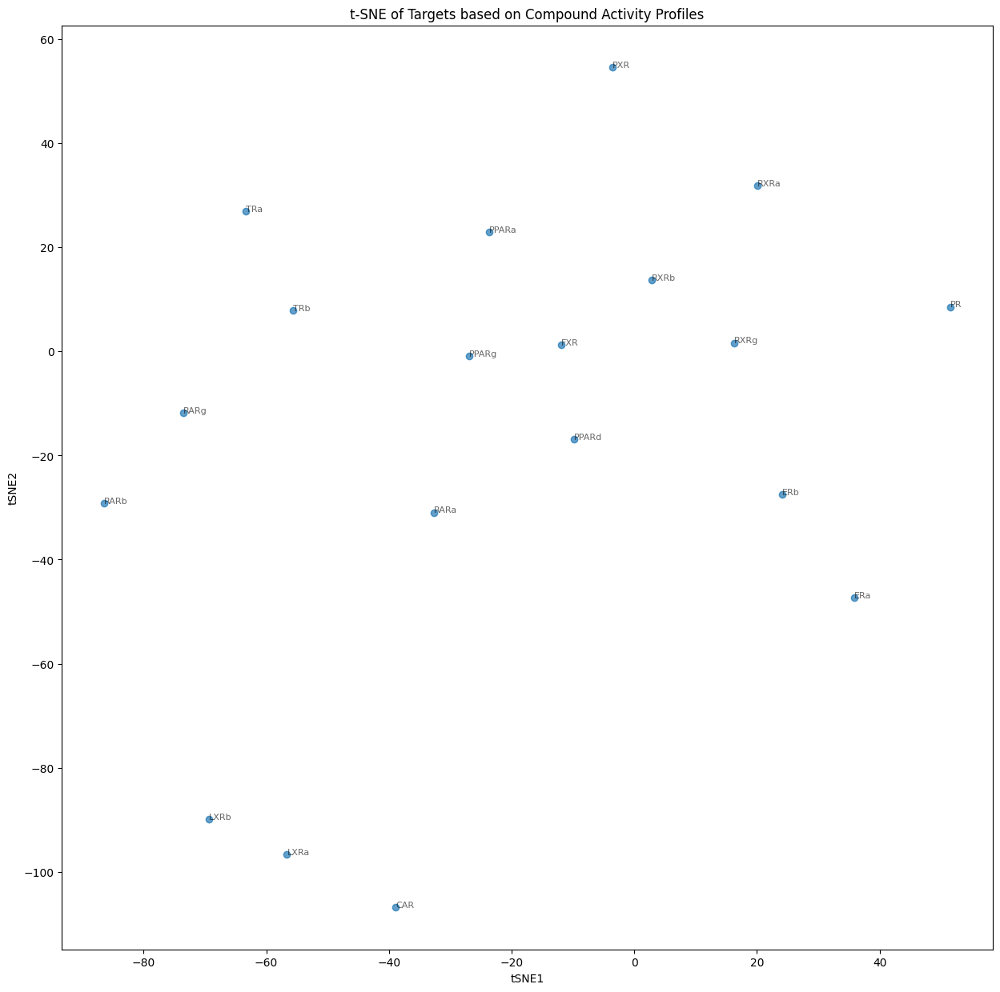

In [ ]:
pivot_data_transposed = pivot_data.T

# Fill any missing values with zeros
pivot_data_filled = pivot_data_transposed.fillna(0)

# Normalize the data for t-SNE
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_data_filled)

# Running t-SNE with scaled data (on targets)
tsne_optimized = TSNE(n_components=2, perplexity=5)
tsne_results_optimized = tsne_optimized.fit_transform(scaled_data)

# Create a DataFrame with the optimized t-SNE results
tsne_df_optimized = pd.DataFrame(tsne_results_optimized, columns=['TSNE1', 'TSNE2'])
tsne_df_optimized['Target'] = pivot_data_filled.index

# Plotting the optimized t-SNE results (for targets)
plt.figure(figsize=(15, 15))
plt.scatter(tsne_df_optimized['TSNE1'], tsne_df_optimized['TSNE2'], alpha=0.7)

# Annotating points for each target
for i in range(len(tsne_df_optimized)):
    plt.annotate(tsne_df_optimized['Target'][i], (tsne_df_optimized['TSNE1'][i], tsne_df_optimized['TSNE2'][i]), fontsize=8, alpha=0.6)

# Set plot labels and title
plt.xlabel('tSNE1')
plt.ylabel('tSNE2')
plt.title('t-SNE of Targets based on Compound Activity Profiles')

# Show the plot
plt.show()